<a href="https://colab.research.google.com/github/tbahng/IST718-FinalProject/blob/master/Final_Project_Workbook_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Covid Project ETL and EDA**

MEMBERS OF THE TEAM | CONTRIBUTION 
------------------- | -------------
Patricia A. Mills | something twitteristic and wicked cool 
Jose Conrado T Reyes | times series analysis bangin out the water 
Thomas Bahng | somthing wicked awesome that'll knock the sox off all
Randall Scott Taylor | kmeans, multilinear regression 

**Task Lists**

 - [x] ETL
 - [ ] EDA
 - [ ] kmeans
 - [ ] linear modeling
 - [x] interactive plotting 


There are data sets that exist on the New York Times website, and git repository at:

https://github.com/nytimes/covid-19-data/


_"The New York Times is releasing a series of data files with cumulative counts of coronavirus cases in the United States, at the state and county level, over time. We are compiling this time series data from state and local governments and health departments in an attempt to provide a complete record of the ongoing outbreak._

_Since late January, The Times has tracked cases of coronavirus in real time as they were identified after testing. Because of the widespread shortage of testing, however, the data is necessarily limited in the picture it presents of the outbreak._

_We have used this data to power our maps and reporting tracking the outbreak, and it is now being made available to the public in response to requests from researchers, scientists and government officials who would like access to the data to better understand the outbreak._

**The data begins with the first reported coronavirus case in Washington State on Jan. 21, 2020. We will publish regular updates to the data in this repository.**

_Live and Historical Data_
_We are providing two sets of data with cumulative counts of coronavirus cases and deaths: one with our most current numbers for each geography and another with historical data showing the tally for each day for each geography._

_The historical data files are at the top level of the directory and contain data up to, but not including the current day. The live data files are in the live/ directory._

_A key difference between the historical and live files is that the numbers in the historical files are the final counts at the end of each day, while the live files have figures that may be a partial count released during the day but cannot necessarily be considered the final, end-of-day tally._

_The historical and live data are released in three files, one for each of these geographic levels: U.S., states and counties._

__Each row of data reports the cumulative number of coronavirus cases and deaths based on our best reporting up to the moment we publish an update. Our counts include both laboratory confirmed and probable cases using criteria that were developed by states and the federal government. Not all geographies are reporting probable cases and yet others are providing confirmed and probable as a single total. Please read here for a full discussion of this issue.__

_We do our best to revise earlier entries in the data when we receive new information. If a county is not listed for a date, then there were zero reported confirmed cases and deaths._

_State and county files contain FIPS codes, a standard geographic identifier, to make it easier for an analyst to combine this data with other data sets like a map file or population data"_ (New York Times).




In [1]:
#!pip install ipyleaflet
#!jupyter nbextension enable --py --sys-prefix ipyleaflet
#!pip install pypiwin32
!pip install autoplotter
!pip install addfips
!pip install fuzzywuzzy
!pip install python-Levenshtein
!pip install -q xlrd
!pip install geopandas
!apt install proj-bin libproj-dev libgeos-dev
!pip install ijson
!pip install plotly.geo 
!pip install plotly
!pip install geopandas
!pip install pyshp
!pip install shapely

!pip install --upgrade plotly
!pip install --upgrade geopandas
!pip install --upgrade pyshp
!pip install --upgrade shapely

#import packages for analysis and modeling

import pandas as pd # dataframe operations##############################
from pandas.io.json import json_normalize###############################
import numpy as np # arrays and math functions##########################
from scipy.stats import uniform # for training and test split###########
import statsmodels.api as sm # statistical models (regression)##########
import statsmodels.formula.api as smf # for R likened specifications####
########################################################################
import addfips # for the import of proper fips coding IMPORTANTE########

import matplotlib

matplotlib.use('Agg')
matplotlib.style.use('ggplot')

import matplotlib.pyplot as plt # 2D plotting (very 2010 )
import seaborn as sns #provides trellis, small multiple plotting (not my favorite)
from scipy import stats
from statsmodels.formula.api import ols
import scipy.stats as stats 
from sklearn import linear_model
from shapely.geometry import Point, Polygon
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import decimal
from fuzzywuzzy import fuzz
from fuzzywuzzy import process 
from string import ascii_letters
#import chart_studio.plotly as py  --  next time (keep as a template install )
#import plotly.graph_objs as go4 -- next time (keep as a template install )

#geospatial analysis 
import plotly.figure_factory as ff
import plotly.express as px 
import plotly.graph_objects as go
from plotly.figure_factory._county_choropleth import create_choropleth
plt.style.use('fivethirtyeight')

#import plotly-geo
from sklearn.preprocessing import StandardScaler 
#from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap 
from geopandas import GeoDataFrame
from shapely.geometry import Point
#from ipyleaflet import *
#from ipyleaflet import Map, GeoData, basemaps, LayersControl
#import geopandas
import folium
#from ipyleaflet import Map, GeoData, basemaps, LayersControl
import geopandas
import json
import urllib.request 
from urllib.request import Request, urlopen
from urllib.request import urlopen as req
import addfips
from bs4 import BeautifulSoup as soup
#import csv
#from urllib.request import Request, urlopen
#from urllib.request import urlopen as req
#from bs4 import BeautifulSoup as soup
#from autoplotter import run_app #GUI_Based EDA 

#pull in datasets GitHub Repository 
!git clone https://github.com/randallscott25/BigData
!git clone https://github.com/nytimes/covid-19-data/


     |████████████████████████████████| 51kB 2.5MB/s 
     |████████████████████████████████| 1.8MB 7.5MB/s 
     |████████████████████████████████| 112kB 39.7MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 71kB 7.2MB/s 
     |████████████████████████████████| 194kB 33.7MB/s 
     |████████████████████████████████| 3.4MB 35.2MB/s 
     |████████████████████████████████| 1.2MB 38.8MB/s 
     |████████████████████████████████| 358kB 37.8MB/s 
  Created wheel for dash-bootstrap-components: filename=dash_bootstrap_components-0.10.5-cp36-none-any.whl size=180067 sha256=dcd226e18e8e9b485afbceb4b9c1e60159b5a4a9848634910db1fb56d94e8c1e
  Stored in directory: /root/.cache/pip/wheels/41/7a/35/3c7ab615003bb9dbfcced330982b5a42f0d3a4c02e317b46ac
Successfully built dash-bootstrap-components
  Created wheel for dash-table: filename=dash_table-4.10.0-cp36-none-any.whl size=182499

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Cloning into 'BigData'...
remote: Enumerating objects: 52, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 52 (delta 17), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (52/52), done.
Cloning into 'covid-19-data'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 5213 (delta 1), reused 9 (delta 1), pack-reused 5204
Receiving objects: 100% (5213/5213), 74.59 MiB | 25.76 MiB/s, done.
Resolving deltas: 100% (3096/3096), done.


In [2]:
#We did not use this code. 
#covid_cdc_git = 'BigData/Provisional_COVID-19_Death_Counts_in_the_United_States_by_County.csv'
#covid_cdc_csv = pd.read_csv(covid_cdc_git, sep=',')

#covid_cdc_csv
#covid_cdc_csv.describe
#print(list(covid_cdc_csv))


#loggerConfig = 'loggerConfig.yaml'
loglevel = 10 # 10-DEBUG, 20-INFO, 30-WARNING, 40-ERROR, 50-CRITICAL
#pull the randall_util file from github
!git clone https://github.com/randallscott25/utilities
import sys
sys.path.insert(0,'/content/utilities')  #/content/fashion-mnist
from randall_utils import * 
import randall_utils as rt



Cloning into 'utilities'...
remote: Enumerating objects: 23, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 23 (delta 5), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (23/23), done.


In [3]:
# get loggers
#warnings.filterwarnings('ignore')
sh_logger = rt.getSHLogger(name='stream_handler',level=loglevel)

# First Dataset 

In [4]:
#This is an up to do repository of the latest fips county / state codes and their long and lats It will be utilized as a connector to a bridge table 
fips_url = 'https://raw.githubusercontent.com/josh-byster/fips_lat_long/master/fips_map.json'#https://data.cdc.gov/resource/kn79-hsxy.json'
################################convert the .json file into a pandas dataframe#############################
response = urllib.request.urlopen(fips_url)
json_string = response.read().decode('utf-8')
eq_parsed_json = json.loads(json_string)
type(eq_parsed_json)
#eq_parsed_json
eq_parsed_json
#from pandas.io.json import json_normalize
json_normalize(eq_parsed_json)
#fips = json_normalize(eq_parsed_json, sep=",")
#fips
fips = pd.DataFrame.from_dict(eq_parsed_json, dtype=object, orient="index")


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



In [5]:
fips.reset_index(level=0, inplace=True)    
#print(fips)
#fips.dtypes

# Let us clean the data and standardize the columns naming for joins to the At Risk CDC Data (2010)
fips.columns = ['fips','state abbr', 'county name', 'lat', 'long']
#fips.reindex(columns=['fips_keep', 'state', 'name','lat','long'])

#fips = fips.reset_index()
#fips.dtypes
#del fips['index']
fips = fips[fips['state abbr']!='PR']
#fips = fips[fips['state abbr']!='AK']
fips

,fips,state abbr,county name,lat,long
0,1001,AL,Autauga County,32.5322,-86.6464
1,1003,AL,Baldwin County,30.6592,-87.7461
2,1005,AL,Barbour County,31.8703,-85.4051
3,1007,AL,Bibb County,33.0159,-87.1271
4,1009,AL,Blount County,33.9774,-86.5664
...,...,...,...,...,...
3137,56037,WY,Sweetwater County,41.6603,-108.876
3138,56039,WY,Teton County,44.0487,-110.426
3139,56041,WY,Uinta County,41.2847,-110.559
3140,56043,WY,Washakie County,43.8788,-107.669


In [6]:
#create a csv for visual inspection of the data. 
#fips = fips[fips['state abbr']!='AK']
fips
fips.to_csv('fips.csv')

# This dataset is now complete and wrangled. Notice the data type of the fips code


# Second Dataset 

In [7]:
#This is the daily updated source of our COVID-19 data. This is directly sourced from the New York Times GitHub repository 
nty_git_counties = 'covid-19-data/live/us-counties.csv'
nty_git_state = 'covid-19-data/live/us-states.csv'
nyt_counties = pd.read_csv(nty_git_counties, sep=',')
nyt_states = pd.read_csv(nty_git_state, sep=',')
#covid_cdc_csv
#covid_cdc_csv.describe
#print(list(covid_cdc_csv))

In [8]:
#Feature data types transformation 
nyt_counties
nyt_counties.dtypes
#These will not do, at all. We need to convert 
nyt_counties['date']=pd.to_datetime(nyt_counties['date'])
#nyt_counties['fips']=pd.to_object(nyt_counties['fips'])
nyt_counties['fips'] = nyt_counties.fips.astype(object)
nyt_counties.dtypes

date                datetime64[ns]
county                      object
state                       object
fips                        object
cases                        int64
deaths                     float64
confirmed_cases            float64
confirmed_deaths           float64
probable_cases             float64
probable_deaths            float64
dtype: object

In [9]:
#change the column names such that they will align with the proceeding datasets
nyt_counties.columns = ['date','county name', 'state', 'fips', 'cases','deaths','confirmed cases','confirmed deaths','probable cases','probable deaths']
nyt_counties = nyt_counties[nyt_counties['state']!='Puerto Rico']
nyt_counties = nyt_counties[nyt_counties['state']!='Virgin Islands']
#nyt_counties = nyt_counties[nyt_counties['state']!='Alaska']
nyt_counties.to_csv('nyt_counties.csv')

In [10]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())

date                   0
county name            0
state                  0
fips                  29
cases                  0
deaths                 0
confirmed cases      539
confirmed deaths     984
probable cases      2244
probable deaths     2558
dtype: int64


In [11]:
# Detecting numbers 
#cnt=0
#for row in nyt_counties['confirmed cases']:
#    try:
#        int(row)
#        nyt_counties.loc[cnt, 'confirmed cases']=np.nan
#    except ValueError:
#        pass
#    cnt+=1
#Function to drop the duplicates '_x


In [12]:
median = nyt_counties['confirmed cases'].median()
nyt_counties['confirmed cases'].fillna(median, inplace=True)
print("DataFrame:")
print(nyt_counties)
print("Filled DataFrame:")
print(nyt_counties)

DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0             4.0
2    2020-08-29     Barbour  ...          125.0             0.0
3    2020-08-29        Bibb  ...           18.0             1.0
4    2020-08-29      Blount  ...          236.0             0.0
...         ...         ...  ...            ...             ...
3228 2020-08-29  Sweetwater  ...           18.0             NaN
3229 2020-08-29       Teton  ...           34.0             NaN
3230 2020-08-29       Uinta  ...           50.0             NaN
3231 2020-08-29    Washakie  ...            8.0             NaN
3232 2020-08-29      Weston  ...            6.0             NaN

[3151 rows x 10 columns]
Filled DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0  

In [13]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())

date                   0
county name            0
state                  0
fips                  29
cases                  0
deaths                 0
confirmed cases        0
confirmed deaths     984
probable cases      2244
probable deaths     2558
dtype: int64


In [14]:
median = nyt_counties['confirmed deaths'].median()
nyt_counties['confirmed deaths'].fillna(median, inplace=True)
print("DataFrame:")
print(nyt_counties)
print("Filled DataFrame:")
print(nyt_counties)

DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0             4.0
2    2020-08-29     Barbour  ...          125.0             0.0
3    2020-08-29        Bibb  ...           18.0             1.0
4    2020-08-29      Blount  ...          236.0             0.0
...         ...         ...  ...            ...             ...
3228 2020-08-29  Sweetwater  ...           18.0             NaN
3229 2020-08-29       Teton  ...           34.0             NaN
3230 2020-08-29       Uinta  ...           50.0             NaN
3231 2020-08-29    Washakie  ...            8.0             NaN
3232 2020-08-29      Weston  ...            6.0             NaN

[3151 rows x 10 columns]
Filled DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0  

In [15]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())

date                   0
county name            0
state                  0
fips                  29
cases                  0
deaths                 0
confirmed cases        0
confirmed deaths       0
probable cases      2244
probable deaths     2558
dtype: int64


In [16]:
median = nyt_counties['probable cases'].median()
nyt_counties['probable cases'].fillna(median, inplace=True)
print("DataFrame:")
print(nyt_counties)
print("Filled DataFrame:")
print(nyt_counties)

DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0             4.0
2    2020-08-29     Barbour  ...          125.0             0.0
3    2020-08-29        Bibb  ...           18.0             1.0
4    2020-08-29      Blount  ...          236.0             0.0
...         ...         ...  ...            ...             ...
3228 2020-08-29  Sweetwater  ...           18.0             NaN
3229 2020-08-29       Teton  ...           34.0             NaN
3230 2020-08-29       Uinta  ...           50.0             NaN
3231 2020-08-29    Washakie  ...            8.0             NaN
3232 2020-08-29      Weston  ...            6.0             NaN

[3151 rows x 10 columns]
Filled DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0  

In [17]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())

date                   0
county name            0
state                  0
fips                  29
cases                  0
deaths                 0
confirmed cases        0
confirmed deaths       0
probable cases         0
probable deaths     2558
dtype: int64


In [18]:
med = nyt_counties['probable deaths'].median()
nyt_counties['probable deaths'].fillna( med, inplace=True)
print("DataFrame:")
print(nyt_counties)
print("Filled DataFrame:")
print(nyt_counties)

DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0             4.0
2    2020-08-29     Barbour  ...          125.0             0.0
3    2020-08-29        Bibb  ...           18.0             1.0
4    2020-08-29      Blount  ...          236.0             0.0
...         ...         ...  ...            ...             ...
3228 2020-08-29  Sweetwater  ...           18.0             1.0
3229 2020-08-29       Teton  ...           34.0             1.0
3230 2020-08-29       Uinta  ...           50.0             1.0
3231 2020-08-29    Washakie  ...            8.0             1.0
3232 2020-08-29      Weston  ...            6.0             1.0

[3151 rows x 10 columns]
Filled DataFrame:
           date county name  ... probable cases probable deaths
0    2020-08-29     Autauga  ...           93.0             1.0
1    2020-08-29     Baldwin  ...          117.0  

In [19]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())

date                 0
county name          0
state                0
fips                29
cases                0
deaths               0
confirmed cases      0
confirmed deaths     0
probable cases       0
probable deaths      0
dtype: int64


In [20]:
#zero = nyt_counties['probable cases'].median()
nyt_counties['fips'].fillna( 0, inplace=True)
print("DataFrame:")
print(nyt_counties)
print("Filled DataFrame:")
print(nyt_counties)

DataFrame:
           date county name  ... probable cases  probable deaths
0    2020-08-29     Autauga  ...           93.0              1.0
1    2020-08-29     Baldwin  ...          117.0              4.0
2    2020-08-29     Barbour  ...          125.0              0.0
3    2020-08-29        Bibb  ...           18.0              1.0
4    2020-08-29      Blount  ...          236.0              0.0
...         ...         ...  ...            ...              ...
3228 2020-08-29  Sweetwater  ...           18.0              1.0
3229 2020-08-29       Teton  ...           34.0              1.0
3230 2020-08-29       Uinta  ...           50.0              1.0
3231 2020-08-29    Washakie  ...            8.0              1.0
3232 2020-08-29      Weston  ...            6.0              1.0

[3151 rows x 10 columns]
Filled DataFrame:
           date county name  ... probable cases  probable deaths
0    2020-08-29     Autauga  ...           93.0              1.0
1    2020-08-29     Baldwin  ...   

In [21]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(nyt_counties.isnull().sum())
#nyt_counties['fips'] = nyt_counties.fips.astype(object)


date                0
county name         0
state               0
fips                0
cases               0
deaths              0
confirmed cases     0
confirmed deaths    0
probable cases      0
probable deaths     0
dtype: int64


# This dataset is now complete and wrangled. Notice the data type of the fips code


In [22]:
nyt_counties['fips'] = nyt_counties['fips'].astype(str).replace('\.0', '', regex=True)
nyt_counties['fips'] = nyt_counties['fips'].apply(lambda x: str(x).zfill(5))

In [23]:
nyt_counties

,date,county name,state,fips,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths
0,2020-08-29,Autauga,Alabama,01001,1389,23.0,1296.0,22.0,93.0,1.0
1,2020-08-29,Baldwin,Alabama,01003,4347,39.0,4230.0,35.0,117.0,4.0
2,2020-08-29,Barbour,Alabama,01005,745,7.0,620.0,7.0,125.0,0.0
3,2020-08-29,Bibb,Alabama,01007,535,6.0,517.0,5.0,18.0,1.0
4,2020-08-29,Blount,Alabama,01009,1219,9.0,983.0,9.0,236.0,0.0
...,...,...,...,...,...,...,...,...,...,...
3228,2020-08-29,Sweetwater,Wyoming,56037,296,2.0,278.0,5.0,18.0,1.0
3229,2020-08-29,Teton,Wyoming,56039,424,1.0,390.0,5.0,34.0,1.0
3230,2020-08-29,Uinta,Wyoming,56041,292,2.0,242.0,5.0,50.0,1.0
3231,2020-08-29,Washakie,Wyoming,56043,107,5.0,99.0,5.0,8.0,1.0


data = https://healthdata.gov/dataset/community-health-status-indicators-chsi-combat-obesity-heart-disease-and-cancer/resource 
# Third Dataset 
https://www.cdc.gov/media/releases/2015/a0310-chsi.html

Today, CDC released the updated Community Health Status Indicators (CHSI) online tool that produces public health profiles for all 3,143 counties in the United States. Each profile includes key indicators of health outcomes, which describes the population health status of a county and factors that have the potential to influence health outcomes, such as health care access and quality, health behaviors, social factors, and the physical environment.

The re-designed online application includes updated peer county groups, health status indicators, a summary comparison page, and U.S. Census tract data and indicators for sub-populations (age groups, sex, and race/ethnicity) to identify potential health disparities.  In this new version of CHSI, all indicators are benchmarked against those of peer counties, the median of all U.S. counties, and Healthy People 2020 targets.  Organizations conducting community health assessments can use CHSI data to:

    Assess community health status and identify disparities;
    Promote a shared understanding of the wide range of factors that can influence health; and
    Mobilize multi-sector partnerships to work together to improve population health.


In [24]:
CHSI_cdc_url = 'BigData/chsi_master.csv'
CHSI_cdc = pd.read_csv(CHSI_cdc_url, sep=',',index_col=None)
CHSI_cdc = CHSI_cdc.drop(columns='Unnamed: 0')
CHSI_cdc
CHSI_cdc.dtypes
print(CHSI_cdc)

      County_FIPS_Code  State_FIPS_Code  ... Unhealthy_Days US_Unhealthy_Days
0                    1                1  ...            7.5                 6
1                    3                1  ...            6.7                 6
2                    5                1  ...            NaN                 6
3                    7                1  ...            NaN                 6
4                    9                1  ...            7.9                 6
...                ...              ...  ...            ...               ...
3136                37               56  ...            6.2                 6
3137                39               56  ...            4.5                 6
3138                41               56  ...            6.2                 6
3139                43               56  ...            5.4                 6
3140                45               56  ...            5.1                 6

[3141 rows x 140 columns]


In [25]:
#Clean up the CDC data set to needed columns 
CHSI_cdc = CHSI_cdc.drop(columns = ['Strata_ID_Number','Strata_Determining_Factors','Number_Counties',
                                  'Ecol_Rpt','Ecol_Rpt_Ind','Ecol_Exp','Salm_Rpt','Salm_Rpt_Ind',
                                  'Salm_Exp','Shig_Rpt','Shig_Rpt_Ind','Shig_Exp', 'Lead_Ind' ,	'EH_Time_Span',
                                  'Toxic_Chem', 'Carbon_Monoxide_Ind','Nitrogen_Dioxide_Ind', 'Sulfur_Dioxide_Ind', 'Ozone_Ind', 'Particulate_Matter_Ind',
                                  'LCD_Time_Span',  'All_Death', 'Health_Status' ,	'US_Health_Status','Unhealthy_Days', 'US_Unhealthy_Days', 	
                                    'Community_Health_Center_Ind' ,	'HPSA_Ind', 	'A_Wh_Comp', 	'A_Bl_Comp', 	'A_Ot_Comp' ,'D_Wh_HeartDis' ,	'D_Bl_HeartDis', 	'D_Ot_HeartDis' ,	'D_Hi_HeartDis',
                                   'D_Wh_Suicide', 	'D_Bl_Suicide' ,	'D_Ot_Suicide' ,	'D_Hi_Suicide' ,	'D_Wh_HIV' ,	'D_Bl_HIV' ,	'D_Ot_HIV' ,	'D_Hi_HIV' ,	'D_Wh_Homicide' ,	'D_Bl_Homicide' ,	'D_Ot_Homicide', 	'D_Hi_Homicide', 	
                                   'E_Wh_Cancer',  'E_Bl_Cancer', 	'E_Ot_Cancer' ,	'E_Hi_Cancer' ,	'E_Wh_HeartDis' 	, 'E_Bl_HeartDis' ,	'E_Ot_HeartDis' ,	'E_Hi_HeartDis' ,	'F_Wh_HeartDis' ,	'F_Bl_HeartDis' ,	'F_Ot_HeartDis', 	
                                   'F_Hi_HeartDis' ,	'F_Wh_Cancer' ,	'F_Bl_Cancer' ,	'F_Ot_Cancer' ,	'F_Hi_Cancer', 'A_Hi_Comp', 	'A_Wh_BirthDef', 	'A_Bl_BirthDef', 	'A_Ot_BirthDef' ,'A_Hi_BirthDef' ,	'C_Wh_Homicide' ,	'C_Bl_Homicide',
                                    	'C_Hi_Homicide',	'C_Wh_Suicide', 'C_Bl_Suicide', 	'C_Ot_Suicide', 	'C_Hi_Suicide', 	'C_Wh_Cancer', 	'C_Bl_Cancer', 	'C_Ot_Cancer' ,	'C_Hi_Cancer' ,	'D_Wh_Injury' ,'D_Bl_Injury',
                                   'D_Ot_Injury', 'D_Hi_Injury', 'D_Wh_Cancer', 	'D_Bl_Cancer', 	'D_Ot_Cancer', 'D_Hi_Cancer', 'B_Wh_Injury', 	'B_Bl_Injury', 	'B_Ot_Injury', 	'B_Hi_Injury', 	'B_Wh_Cancer', 	'B_Bl_Cancer', 	'B_Ot_Cancer', 	
                                   'B_Hi_Cancer', 'B_Wh_Homicide' ,'C_Ot_homicide' ,	'B_Bl_Homicide', 'B_Ot_Homicide', 'B_Hi_Homicide', 'C_Wh_Injury', 'C_Bl_Injury', 'C_Ot_Injury', 'C_Hi_Injury','US_ALE'	])

                   

In [26]:
CHSI_cdc

,County_FIPS_Code,State_FIPS_Code,CHSI_County_Name,CHSI_State_Name,CHSI_State_Abbr,Population_Size,Population_Density,Poverty,Age_19_Under,Age_19_64,Age_65_84,Age_85_and_Over,White,Black,Native_American,Asian,Hispanic,No_HS_Diploma,Unemployed,Sev_Work_Disabled,Major_Depression,Recent_Drug_Use,No_Exercise,Few_Fruit_Veg,Obesity,High_Blood_Pres,Smoker,Diabetes,Uninsured,Elderly_Medicare,Disabled_Medicare,Prim_Care_Phys_Rate,Dentist_Rate,ALE,US_All_Death
0,1,1,Autauga,Alabama,AL,48612,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680,2394,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,3,1,Baldwin,Alabama,AL,162586,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354,7753,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,5,1,Barbour,Alabama,AL,28414,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618,1403,NaN,NaN,25.6,NaN,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,7,1,Bibb,Alabama,AL,21516,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218,1034,NaN,86.6,NaN,NaN,NaN,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,9,1,Blount,Alabama,AL,55725,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164,2675,33.5,74.6,24.2,NaN,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3136,37,56,Sweetwater,Wyoming,WY,37975,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649,1782,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3137,39,56,Teton,Wyoming,WY,19032,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455,789,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3138,41,56,Uinta,Wyoming,WY,19939,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347,963,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6
3139,43,56,Washakie,Wyoming,WY,7933,4.0,11.1,23.5,59.5,14.6,2.3,97.2,0.2,0.8,0.7,12.1,780.0,182.0,168.0,576,363,23.2,78.1,21.1,27.8,19.7,9.4,1178.0,1338.0,136.0,50.4,50.4,77.7,898.6


In [27]:
# The Column Names will need to be edited as to better allow for a Pandas join 

CHSI_cdc.columns = ['fips',	'state fips',	'county name',	'state name',	'state abbr', 'pop_size',	'pop density',	'poverty',	'age 19 under',	'age 19 to 64',	'age 65 to 84',	'age 85 and over',	'white',	'black',	'native american',	'asian',	'hispanic', 'no_hs_diploma','unemployed',	'sev work disabled',	'major depression', 'recent drug use', 'no exercise',	'few fruit veg',	'obesity','high blood pres',	'smoker',	'diabetes',	'uninsured',	'elderly medicare',	'disabled medicare',	'prim care phys rate',	'dentist rate',	'us ale',	'us all death']

In [28]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               1
poverty                   1
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             1
unemployed                8
sev work disabled        28
major depression          0
recent drug use           0
no exercise             935
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [29]:
med = CHSI_cdc['sev work disabled'].median()
CHSI_cdc['sev work disabled'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [30]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               1
poverty                   1
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             1
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise             935
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [31]:
med = CHSI_cdc['pop density'].median()
CHSI_cdc['pop density'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [32]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   1
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             1
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise             935
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [33]:
med = CHSI_cdc['poverty'].median()
CHSI_cdc['poverty'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [34]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   0
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             1
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise             935
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [35]:
med = CHSI_cdc['no_hs_diploma'].median()
CHSI_cdc['no_hs_diploma'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [36]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   0
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             0
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise             935
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [37]:
med = CHSI_cdc['no exercise'].median()
CHSI_cdc['no exercise'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [38]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   0
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             0
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise               0
few fruit veg          1237
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [39]:
med = CHSI_cdc['few fruit veg'].median()
CHSI_cdc['few fruit veg'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [40]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   0
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             0
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise               0
few fruit veg             0
obesity                 917
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [41]:
med = CHSI_cdc['obesity'].median()
CHSI_cdc['obesity'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [42]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                      0
state fips                0
county name               0
state name                0
state abbr                0
pop_size                  0
pop density               0
poverty                   0
age 19 under              0
age 19 to 64              0
age 65 to 84              0
age 85 and over           0
white                     0
black                     0
native american           0
asian                     0
hispanic                  0
no_hs_diploma             0
unemployed                8
sev work disabled         0
major depression          0
recent drug use           0
no exercise               0
few fruit veg             0
obesity                   0
high blood pres        1619
smoker                  874
diabetes                422
uninsured                 3
elderly medicare         31
disabled medicare        32
prim care phys rate       0
dentist rate              1
us ale                    2
us all death              1
dtype: int64


In [43]:
med = CHSI_cdc['high blood pres'].median()
CHSI_cdc['high blood pres'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [44]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                     0
state fips               0
county name              0
state name               0
state abbr               0
pop_size                 0
pop density              0
poverty                  0
age 19 under             0
age 19 to 64             0
age 65 to 84             0
age 85 and over          0
white                    0
black                    0
native american          0
asian                    0
hispanic                 0
no_hs_diploma            0
unemployed               8
sev work disabled        0
major depression         0
recent drug use          0
no exercise              0
few fruit veg            0
obesity                  0
high blood pres          0
smoker                 874
diabetes               422
uninsured                3
elderly medicare        31
disabled medicare       32
prim care phys rate      0
dentist rate             1
us ale                   2
us all death             1
dtype: int64


In [45]:
med = CHSI_cdc['smoker'].median()
CHSI_cdc['smoker'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [46]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                     0
state fips               0
county name              0
state name               0
state abbr               0
pop_size                 0
pop density              0
poverty                  0
age 19 under             0
age 19 to 64             0
age 65 to 84             0
age 85 and over          0
white                    0
black                    0
native american          0
asian                    0
hispanic                 0
no_hs_diploma            0
unemployed               8
sev work disabled        0
major depression         0
recent drug use          0
no exercise              0
few fruit veg            0
obesity                  0
high blood pres          0
smoker                   0
diabetes               422
uninsured                3
elderly medicare        31
disabled medicare       32
prim care phys rate      0
dentist rate             1
us ale                   2
us all death             1
dtype: int64


In [47]:
med = CHSI_cdc['diabetes'].median()
CHSI_cdc['diabetes'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [48]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                    0
state fips              0
county name             0
state name              0
state abbr              0
pop_size                0
pop density             0
poverty                 0
age 19 under            0
age 19 to 64            0
age 65 to 84            0
age 85 and over         0
white                   0
black                   0
native american         0
asian                   0
hispanic                0
no_hs_diploma           0
unemployed              8
sev work disabled       0
major depression        0
recent drug use         0
no exercise             0
few fruit veg           0
obesity                 0
high blood pres         0
smoker                  0
diabetes                0
uninsured               3
elderly medicare       31
disabled medicare      32
prim care phys rate     0
dentist rate            1
us ale                  2
us all death            1
dtype: int64


In [49]:
med = CHSI_cdc['uninsured'].median()
CHSI_cdc['uninsured'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [50]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                    0
state fips              0
county name             0
state name              0
state abbr              0
pop_size                0
pop density             0
poverty                 0
age 19 under            0
age 19 to 64            0
age 65 to 84            0
age 85 and over         0
white                   0
black                   0
native american         0
asian                   0
hispanic                0
no_hs_diploma           0
unemployed              8
sev work disabled       0
major depression        0
recent drug use         0
no exercise             0
few fruit veg           0
obesity                 0
high blood pres         0
smoker                  0
diabetes                0
uninsured               0
elderly medicare       31
disabled medicare      32
prim care phys rate     0
dentist rate            1
us ale                  2
us all death            1
dtype: int64


In [51]:
med = CHSI_cdc['elderly medicare'].median()
CHSI_cdc['elderly medicare'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [52]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                    0
state fips              0
county name             0
state name              0
state abbr              0
pop_size                0
pop density             0
poverty                 0
age 19 under            0
age 19 to 64            0
age 65 to 84            0
age 85 and over         0
white                   0
black                   0
native american         0
asian                   0
hispanic                0
no_hs_diploma           0
unemployed              8
sev work disabled       0
major depression        0
recent drug use         0
no exercise             0
few fruit veg           0
obesity                 0
high blood pres         0
smoker                  0
diabetes                0
uninsured               0
elderly medicare        0
disabled medicare      32
prim care phys rate     0
dentist rate            1
us ale                  2
us all death            1
dtype: int64


In [53]:
med = CHSI_cdc['disabled medicare'].median()
CHSI_cdc['disabled medicare'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [54]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                   0
state fips             0
county name            0
state name             0
state abbr             0
pop_size               0
pop density            0
poverty                0
age 19 under           0
age 19 to 64           0
age 65 to 84           0
age 85 and over        0
white                  0
black                  0
native american        0
asian                  0
hispanic               0
no_hs_diploma          0
unemployed             8
sev work disabled      0
major depression       0
recent drug use        0
no exercise            0
few fruit veg          0
obesity                0
high blood pres        0
smoker                 0
diabetes               0
uninsured              0
elderly medicare       0
disabled medicare      0
prim care phys rate    0
dentist rate           1
us ale                 2
us all death           1
dtype: int64


In [55]:
med = CHSI_cdc['dentist rate'].median()
CHSI_cdc['dentist rate'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [56]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                   0
state fips             0
county name            0
state name             0
state abbr             0
pop_size               0
pop density            0
poverty                0
age 19 under           0
age 19 to 64           0
age 65 to 84           0
age 85 and over        0
white                  0
black                  0
native american        0
asian                  0
hispanic               0
no_hs_diploma          0
unemployed             8
sev work disabled      0
major depression       0
recent drug use        0
no exercise            0
few fruit veg          0
obesity                0
high blood pres        0
smoker                 0
diabetes               0
uninsured              0
elderly medicare       0
disabled medicare      0
prim care phys rate    0
dentist rate           0
us ale                 2
us all death           1
dtype: int64


In [57]:
med = CHSI_cdc['us ale'].median()
CHSI_cdc['us ale'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [58]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                   0
state fips             0
county name            0
state name             0
state abbr             0
pop_size               0
pop density            0
poverty                0
age 19 under           0
age 19 to 64           0
age 65 to 84           0
age 85 and over        0
white                  0
black                  0
native american        0
asian                  0
hispanic               0
no_hs_diploma          0
unemployed             8
sev work disabled      0
major depression       0
recent drug use        0
no exercise            0
few fruit veg          0
obesity                0
high blood pres        0
smoker                 0
diabetes               0
uninsured              0
elderly medicare       0
disabled medicare      0
prim care phys rate    0
dentist rate           0
us ale                 0
us all death           1
dtype: int64


In [59]:
med = CHSI_cdc['us all death'].median()
CHSI_cdc['us all death'].fillna(med, inplace=True)
print("DataFrame:")
print(CHSI_cdc)
print("Filled DataFrame:")
print(CHSI_cdc)

DataFrame:
      fips  state fips county name  ... dentist rate us ale  us all death
0        1           1     Autauga  ...         22.6   74.9         898.6
1        3           1     Baldwin  ...         30.8   76.6         898.6
2        5           1     Barbour  ...         24.6   74.5         898.6
3        7           1        Bibb  ...         18.6   73.2         898.6
4        9           1      Blount  ...         10.8   76.1         898.6
...    ...         ...         ...  ...          ...    ...           ...
3136    37          56  Sweetwater  ...         52.7   76.1         898.6
3137    39          56       Teton  ...         57.8   78.2         898.6
3138    41          56       Uinta  ...         40.1   78.2         898.6
3139    43          56    Washakie  ...         50.4   77.7         898.6
3140    45          56      Weston  ...         30.0   77.4         898.6

[3141 rows x 35 columns]
Filled DataFrame:
      fips  state fips county name  ... dentist rate us a

In [60]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(CHSI_cdc.isnull().sum())

fips                   0
state fips             0
county name            0
state name             0
state abbr             0
pop_size               0
pop density            0
poverty                0
age 19 under           0
age 19 to 64           0
age 65 to 84           0
age 85 and over        0
white                  0
black                  0
native american        0
asian                  0
hispanic               0
no_hs_diploma          0
unemployed             8
sev work disabled      0
major depression       0
recent drug use        0
no exercise            0
few fruit veg          0
obesity                0
high blood pres        0
smoker                 0
diabetes               0
uninsured              0
elderly medicare       0
disabled medicare      0
prim care phys rate    0
dentist rate           0
us ale                 0
us all death           0
dtype: int64


# This dataset is now complete and wrangled. Notice the data type of the fips code


In [61]:
#create a static csv to preserve data in case it is taken down by the administration, again 
CHSI_cdc['fips'] = CHSI_cdc.fips.astype(object)
CHSI_cdc['state fips'] = CHSI_cdc.fips.astype(object)
CHSI_cdc.to_csv('CHSI_master_data.csv')


# Combination of datasets to create one master pandas dataframe
**_utilize bridge.csv to address Washington D.C. fips Code_**




#1st dataset combination to the bridge
_*NYT*_

In [62]:
#bridge csv
bridge = 'BigData/bridge.csv'
bridgeDF = pd.read_csv(bridge, sep=',')
bridgeDF.to_csv('bridgeDF.csv')
bridgeDF['fips'] = bridgeDF.fips.astype(object)
bridgeDF.to_csv('bridgeDF.csv')
bridgeDF
bridgeDF['fips'] = bridgeDF['fips'].astype(str).replace('\.0', '', regex=True)
bridgeDF['fips'] = bridgeDF['fips'].apply(lambda x: str(x).zfill(5))
bridgeDF

,SHOULDBE,STATE,ABBR,CURRENTNAME,fips
0,Autauga,Alabama,AL,Autauga County,01001
1,Baldwin,Alabama,AL,Baldwin County,01003
2,Barbour,Alabama,AL,Barbour County,01005
3,Bibb,Alabama,AL,Bibb County,01007
4,Blount,Alabama,AL,Blount County,01009
...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039
3139,Teton,Wyoming,WY,Uinta County,56041
3140,Uinta,Wyoming,WY,Washakie County,56043
3141,Washakie,Wyoming,WY,Weston County,56045


In [63]:
print(list(bridgeDF))
print(list(nyt_counties))


['SHOULDBE ', 'STATE', 'ABBR', 'CURRENTNAME', 'fips']
['date', 'county name', 'state', 'fips', 'cases', 'deaths', 'confirmed cases', 'confirmed deaths', 'probable cases', 'probable deaths']


In [64]:
#Creation of the first pandas merger. Dataframe New York Times(nyt) to the bridge dataframe in order for proper sql like joins 
master_1 = pd.merge(left=bridgeDF, right=nyt_counties, how='left',
                                     left_on=['fips','STATE'], right_on=['fips','state'])
master_1['FinalFIPS'] = master_1['fips'].fillna(master_1['fips'])


In [65]:
master_1

,SHOULDBE,STATE,ABBR,CURRENTNAME,fips,date,county name,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS
0,Autauga,Alabama,AL,Autauga County,01001,2020-08-29,Autauga,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001
1,Baldwin,Alabama,AL,Baldwin County,01003,2020-08-29,Baldwin,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003
2,Barbour,Alabama,AL,Barbour County,01005,2020-08-29,Barbour,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005
3,Bibb,Alabama,AL,Bibb County,01007,2020-08-29,Bibb,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007
4,Blount,Alabama,AL,Blount County,01009,2020-08-29,Blount,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039,2020-08-29,Teton,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039
3139,Teton,Wyoming,WY,Uinta County,56041,2020-08-29,Uinta,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041
3140,Uinta,Wyoming,WY,Washakie County,56043,2020-08-29,Washakie,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043
3141,Washakie,Wyoming,WY,Weston County,56045,2020-08-29,Weston,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045


#2nd Data Combination to the Bridge 
_*FIPS*_

In [66]:
print(list(bridgeDF))
print(list(fips))


['SHOULDBE ', 'STATE', 'ABBR', 'CURRENTNAME', 'fips']
['fips', 'state abbr', 'county name', 'lat', 'long']


In [67]:
#Creation of the first pandas merger. Dataframe New York Times(nyt) to the bridge dataframe in order for proper sql like joins 

master_2 = pd.merge(left=master_1, right=fips, how='left',
                                     left_on=['CURRENTNAME','fips'], right_on=['county name','fips'])
master_2['FinalFIPS'] = master_2['fips'].fillna(master_2['fips'])
master_2

#Creation of the first pandas merger. Dataframe New York Times(nyt) to the bridge dataframe in order for proper sql like joins 
#master_2 = pd.merge(left=fips, right=bridgeDF, how='left',
 #                                         left_on='county name', right_on='ABBR')
#master_2['CountyFinalName'] = master_2['CURRENTNAME'].fillna(master_1['county name'])
#comment about this and why 
#master_2
#master_2['county fips'] = master_1['county fips'].astype(object)
#master_2.to_csv('master_2.csv')
#master_2

,SHOULDBE,STATE,ABBR,CURRENTNAME,fips,date,county name_x,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS,state abbr,county name_y,lat,long
0,Autauga,Alabama,AL,Autauga County,01001,2020-08-29,Autauga,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001,NaN,NaN,NaN,NaN
1,Baldwin,Alabama,AL,Baldwin County,01003,2020-08-29,Baldwin,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003,NaN,NaN,NaN,NaN
2,Barbour,Alabama,AL,Barbour County,01005,2020-08-29,Barbour,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005,NaN,NaN,NaN,NaN
3,Bibb,Alabama,AL,Bibb County,01007,2020-08-29,Bibb,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007,NaN,NaN,NaN,NaN
4,Blount,Alabama,AL,Blount County,01009,2020-08-29,Blount,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039,2020-08-29,Teton,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039,WY,Teton County,44.0487,-110.426
3139,Teton,Wyoming,WY,Uinta County,56041,2020-08-29,Uinta,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041,WY,Uinta County,41.2847,-110.559
3140,Uinta,Wyoming,WY,Washakie County,56043,2020-08-29,Washakie,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043,WY,Washakie County,43.8788,-107.669
3141,Washakie,Wyoming,WY,Weston County,56045,2020-08-29,Weston,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045,WY,Weston County,43.8462,-104.57


# Creation of the 3rd Dataframe
_*CHSI*_

In [68]:
print(list(bridgeDF))
print(list(CHSI_cdc))

CHSI_cdc.shape
bridgeDF.shape

['SHOULDBE ', 'STATE', 'ABBR', 'CURRENTNAME', 'fips']
['fips', 'state fips', 'county name', 'state name', 'state abbr', 'pop_size', 'pop density', 'poverty', 'age 19 under', 'age 19 to 64', 'age 65 to 84', 'age 85 and over', 'white', 'black', 'native american', 'asian', 'hispanic', 'no_hs_diploma', 'unemployed', 'sev work disabled', 'major depression', 'recent drug use', 'no exercise', 'few fruit veg', 'obesity', 'high blood pres', 'smoker', 'diabetes', 'uninsured', 'elderly medicare', 'disabled medicare', 'prim care phys rate', 'dentist rate', 'us ale', 'us all death']


(3143, 5)

In [69]:
master_3 = pd.merge(left=bridgeDF, right=CHSI_cdc, how='right',
                                     left_on=['SHOULDBE ','ABBR'], right_on=['county name','state abbr'])
master_3['FINALCOUNTYNAME'] = master_3['CURRENTNAME'].fillna(master_3['county name'])






#Creation of the first pandas merger. Dataframe New York Times(nyt) to the bridge dataframe in order for proper sql like joins 

#master_3 = pd.merge(left=CHSI_cdc, right=bridgeDF, how='left',
                      #               left_on='county name', right_on='ABBR')
#master_3['CountyFinalName'] = master_3['CURRENTNAME'].fillna(master_1['county name'])
#comment about this and why 
#master_3
#master_3['county fips'] = master_3['county fips'].astype(object)
master_3.to_csv('master_3.csv')
master_3

,SHOULDBE,STATE,ABBR,CURRENTNAME,fips_x,fips_y,state fips,county name,state name,state abbr,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,FINALCOUNTYNAME
0,Autauga,Alabama,AL,Autauga County,01001,1,1,Autauga,Alabama,AL,48612,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680,2394,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6,Autauga County
1,Baldwin,Alabama,AL,Baldwin County,01003,3,3,Baldwin,Alabama,AL,162586,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354,7753,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6,Baldwin County
2,Barbour,Alabama,AL,Barbour County,01005,5,5,Barbour,Alabama,AL,28414,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618,1403,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6,Barbour County
3,Bibb,Alabama,AL,Bibb County,01007,7,7,Bibb,Alabama,AL,21516,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218,1034,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6,Bibb County
4,Blount,Alabama,AL,Blount County,01009,9,9,Blount,Alabama,AL,55725,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164,2675,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6,Blount County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3140,NaN,NaN,NaN,NaN,NaN,830,830,Williamsburg City,Virginia,VA,11751,1376.0,17.5,24.7,60.6,13.1,1.6,81.6,12.5,0.3,4.7,3.0,528.0,358.0,124.0,686,994,26.0,79.0,24.3,26.2,23.0,7.5,959.0,6060.0,459.0,34.0,8.5,79.9,898.6,Williamsburg City
3141,NaN,NaN,NaN,NaN,NaN,840,840,Winchester City,Virginia,VA,25119,2692.0,12.0,24.5,59.3,13.7,2.5,85.4,10.6,0.4,2.0,10.1,4136.0,428.0,481.0,1426,1192,21.4,79.0,24.3,26.2,22.1,3.1,3100.0,4623.0,603.0,290.6,95.5,75.2,898.6,Winchester City
3142,NaN,NaN,NaN,NaN,NaN,1,1,Adams,Washington,WA,16803,9.0,15.8,33.8,55.4,9.4,1.4,96.5,0.7,1.2,0.9,50.4,3475.0,581.0,488.0,896,1094,23.2,79.0,34.5,22.1,17.3,15.4,4102.0,1333.0,178.0,65.5,41.7,77.3,898.6,Adams
3143,NaN,NaN,NaN,NaN,NaN,141,141,Wood,Wisconsin,WI,75234,95.0,7.8,23.8,59.7,13.3,3.2,96.5,0.5,0.7,1.7,1.1,7888.0,2262.0,1693.0,4912,3852,22.6,75.7,25.6,27.5,19.7,7.5,4893.0,13077.0,1497.0,215.3,70.4,79.7,898.6,Wood


# Final Combination of all datasets


In [70]:
#print('master_1', list(master_1)) 
print('master_2',list(master_2))
print('master_3',list(master_3))


master_2 ['SHOULDBE ', 'STATE', 'ABBR', 'CURRENTNAME', 'fips', 'date', 'county name_x', 'state', 'cases', 'deaths', 'confirmed cases', 'confirmed deaths', 'probable cases', 'probable deaths', 'FinalFIPS', 'state abbr', 'county name_y', 'lat', 'long']
master_3 ['SHOULDBE ', 'STATE', 'ABBR', 'CURRENTNAME', 'fips_x', 'fips_y', 'state fips', 'county name', 'state name', 'state abbr', 'pop_size', 'pop density', 'poverty', 'age 19 under', 'age 19 to 64', 'age 65 to 84', 'age 85 and over', 'white', 'black', 'native american', 'asian', 'hispanic', 'no_hs_diploma', 'unemployed', 'sev work disabled', 'major depression', 'recent drug use', 'no exercise', 'few fruit veg', 'obesity', 'high blood pres', 'smoker', 'diabetes', 'uninsured', 'elderly medicare', 'disabled medicare', 'prim care phys rate', 'dentist rate', 'us ale', 'us all death', 'FINALCOUNTYNAME']


In [71]:
### I AM SO FREAKING PROUD OF THIS MOMENT!!!
master_final = pd.merge(left=master_2, right=master_3, how='left',
                                     left_on=['CURRENTNAME','FinalFIPS'], right_on=['FINALCOUNTYNAME','fips_x'])
master_final['FinalFIPS'] = master_final['FinalFIPS'].fillna(master_final['fips_x'])
master_final.to_csv('master_final.csv')
master_final

#working_DF = pd.merge(left=master_1, right=master_2, how='left',
                  #                        left_on='state', right_on='CountyFinalName')
#working_DF['FinalName'] = master_3['CountyFinalName'].fillna(master_1['county name'])
#workingDF = pd.merge(left=master_2, right=master_3, how='left',
            #                              left_on='county name', right_on='CountyFinalName')
#master_3['CountyFinalName'] = master_3['CURRENTNAME'].fillna(master_1['county name'])

#workingDF = pd.merge(left=master_3, right=master_2, how='left',
                #                          left_on='county name', right_on='CountyFinalName')

#workingDF = pd.merge(left=master_1, right=master_2, how='left', left_on='CountyFinalName',right_on='state abbr')
#workingDF = pd.merge(left=master_2, right=master_3, how='left', left_on='CountyFinalName',right_on='state abbr')


,SHOULDBE _x,STATE_x,ABBR_x,CURRENTNAME_x,fips,date,county name_x,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS,state abbr_x,county name_y,lat,long,SHOULDBE _y,STATE_y,ABBR_y,CURRENTNAME_y,fips_x,fips_y,state fips,county name,state name,state abbr_y,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,FINALCOUNTYNAME
0,Autauga,Alabama,AL,Autauga County,01001,2020-08-29,Autauga,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001,NaN,NaN,NaN,NaN,Autauga,Alabama,AL,Autauga County,01001,1,1,Autauga,Alabama,AL,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6,Autauga County
1,Baldwin,Alabama,AL,Baldwin County,01003,2020-08-29,Baldwin,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003,NaN,NaN,NaN,NaN,Baldwin,Alabama,AL,Baldwin County,01003,3,3,Baldwin,Alabama,AL,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6,Baldwin County
2,Barbour,Alabama,AL,Barbour County,01005,2020-08-29,Barbour,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005,NaN,NaN,NaN,NaN,Barbour,Alabama,AL,Barbour County,01005,5,5,Barbour,Alabama,AL,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6,Barbour County
3,Bibb,Alabama,AL,Bibb County,01007,2020-08-29,Bibb,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007,NaN,NaN,NaN,NaN,Bibb,Alabama,AL,Bibb County,01007,7,7,Bibb,Alabama,AL,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6,Bibb County
4,Blount,Alabama,AL,Blount County,01009,2020-08-29,Blount,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009,NaN,NaN,NaN,NaN,Blount,Alabama,AL,Blount County,01009,9,9,Blount,Alabama,AL,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6,Blount County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039,2020-08-29,Teton,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039,WY,Teton County,44.0487,-110.426,Sweetwater,Wyoming,WY,Teton County,56039,37,37,Sweetwater,Wyoming,WY,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6,Teton County
3139,Teton,Wyoming,WY,Uinta County,56041,2020-08-29,Uinta,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041,WY,Uinta County,41.2847,-110.559,Teton,Wyoming,WY,Uinta County,56041,39,39,Teton,Wyoming,WY,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6,Uinta County
3140,Uinta,Wyoming,WY,Washakie County,56043,2020-08-29,Washakie,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043,WY,Washakie County,43.8788,-107.669,Uinta,Wyoming,WY,Washakie County,56043,41,41,Uinta,Wyoming,WY,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6,Washakie County
3141,Washakie,Wyoming,WY,Weston County,56045,2020-08-29,Weston,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045,WY,Weston County,43.8462,-104.57,Washakie,Wyoming,WY,Wes

In [72]:
#master_final.dtypes

In [73]:
projDF = master_final

#It looks like you were on the right path. Here is the one-liner you were looking for:

#projDF.reset_index().T.drop_duplicates().T
projDF



,SHOULDBE _x,STATE_x,ABBR_x,CURRENTNAME_x,fips,date,county name_x,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS,state abbr_x,county name_y,lat,long,SHOULDBE _y,STATE_y,ABBR_y,CURRENTNAME_y,fips_x,fips_y,state fips,county name,state name,state abbr_y,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,FINALCOUNTYNAME
0,Autauga,Alabama,AL,Autauga County,01001,2020-08-29,Autauga,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001,NaN,NaN,NaN,NaN,Autauga,Alabama,AL,Autauga County,01001,1,1,Autauga,Alabama,AL,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6,Autauga County
1,Baldwin,Alabama,AL,Baldwin County,01003,2020-08-29,Baldwin,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003,NaN,NaN,NaN,NaN,Baldwin,Alabama,AL,Baldwin County,01003,3,3,Baldwin,Alabama,AL,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6,Baldwin County
2,Barbour,Alabama,AL,Barbour County,01005,2020-08-29,Barbour,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005,NaN,NaN,NaN,NaN,Barbour,Alabama,AL,Barbour County,01005,5,5,Barbour,Alabama,AL,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6,Barbour County
3,Bibb,Alabama,AL,Bibb County,01007,2020-08-29,Bibb,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007,NaN,NaN,NaN,NaN,Bibb,Alabama,AL,Bibb County,01007,7,7,Bibb,Alabama,AL,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6,Bibb County
4,Blount,Alabama,AL,Blount County,01009,2020-08-29,Blount,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009,NaN,NaN,NaN,NaN,Blount,Alabama,AL,Blount County,01009,9,9,Blount,Alabama,AL,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6,Blount County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039,2020-08-29,Teton,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039,WY,Teton County,44.0487,-110.426,Sweetwater,Wyoming,WY,Teton County,56039,37,37,Sweetwater,Wyoming,WY,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6,Teton County
3139,Teton,Wyoming,WY,Uinta County,56041,2020-08-29,Uinta,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041,WY,Uinta County,41.2847,-110.559,Teton,Wyoming,WY,Uinta County,56041,39,39,Teton,Wyoming,WY,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6,Uinta County
3140,Uinta,Wyoming,WY,Washakie County,56043,2020-08-29,Washakie,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043,WY,Washakie County,43.8788,-107.669,Uinta,Wyoming,WY,Washakie County,56043,41,41,Uinta,Wyoming,WY,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6,Washakie County
3141,Washakie,Wyoming,WY,Weston County,56045,2020-08-29,Weston,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045,WY,Weston County,43.8462,-104.57,Washakie,Wyoming,WY,Wes

In [74]:
#Function to drop the duplicates '_y'
def drop_y(df):
    # list comprehension of the cols that end with '_y'
    to_drop = [x for x in df if x.endswith('_y')]
    df.drop(to_drop, axis=1, inplace=True)


In [75]:
#Function to drop the duplicates '_x
def drop_x(df):
    # list comprehension of the cols that end with '_x'
    to_drop = [x for x in df if x.endswith('_x')]
    df.drop(to_drop, axis=1, inplace=True)

In [76]:
drop_y(projDF)
projDF


,SHOULDBE _x,STATE_x,ABBR_x,CURRENTNAME_x,fips,date,county name_x,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS,state abbr_x,lat,long,fips_x,state fips,county name,state name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,FINALCOUNTYNAME
0,Autauga,Alabama,AL,Autauga County,01001,2020-08-29,Autauga,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001,NaN,NaN,NaN,01001,1,Autauga,Alabama,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6,Autauga County
1,Baldwin,Alabama,AL,Baldwin County,01003,2020-08-29,Baldwin,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003,NaN,NaN,NaN,01003,3,Baldwin,Alabama,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6,Baldwin County
2,Barbour,Alabama,AL,Barbour County,01005,2020-08-29,Barbour,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005,NaN,NaN,NaN,01005,5,Barbour,Alabama,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6,Barbour County
3,Bibb,Alabama,AL,Bibb County,01007,2020-08-29,Bibb,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007,NaN,NaN,NaN,01007,7,Bibb,Alabama,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6,Bibb County
4,Blount,Alabama,AL,Blount County,01009,2020-08-29,Blount,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009,NaN,NaN,NaN,01009,9,Blount,Alabama,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6,Blount County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,Sweetwater,Wyoming,WY,Teton County,56039,2020-08-29,Teton,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039,WY,44.0487,-110.426,56039,37,Sweetwater,Wyoming,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6,Teton County
3139,Teton,Wyoming,WY,Uinta County,56041,2020-08-29,Uinta,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041,WY,41.2847,-110.559,56041,39,Teton,Wyoming,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6,Uinta County
3140,Uinta,Wyoming,WY,Washakie County,56043,2020-08-29,Washakie,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043,WY,43.8788,-107.669,56043,41,Uinta,Wyoming,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6,Washakie County
3141,Washakie,Wyoming,WY,Weston County,56045,2020-08-29,Weston,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045,WY,43.8462,-104.57,56045,43,Washakie,Wyoming,7933.0,4.0,11.1,23.5,59.5,14.6,2.3,97.2,0.2,0.8,0.7,12.1,780.0,182.0,168.0,576.0,363.0,23.2,78.1,21.1,27.8,19.7,9.4,1178.0,1338.0,136.0,50.4,50.4,77.7,898.6,Weston County


In [77]:
drop_x(projDF)
projDF

,fips,date,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,FinalFIPS,lat,long,state fips,county name,state name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,FINALCOUNTYNAME
0,01001,2020-08-29,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,01001,NaN,NaN,1,Autauga,Alabama,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6,Autauga County
1,01003,2020-08-29,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,01003,NaN,NaN,3,Baldwin,Alabama,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6,Baldwin County
2,01005,2020-08-29,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,01005,NaN,NaN,5,Barbour,Alabama,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6,Barbour County
3,01007,2020-08-29,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,01007,NaN,NaN,7,Bibb,Alabama,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6,Bibb County
4,01009,2020-08-29,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,01009,NaN,NaN,9,Blount,Alabama,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6,Blount County
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3138,56039,2020-08-29,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,56039,44.0487,-110.426,37,Sweetwater,Wyoming,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6,Teton County
3139,56041,2020-08-29,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,56041,41.2847,-110.559,39,Teton,Wyoming,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6,Uinta County
3140,56043,2020-08-29,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,56043,43.8788,-107.669,41,Uinta,Wyoming,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6,Washakie County
3141,56045,2020-08-29,Wyoming,18.0,0.0,12.0,5.0,6.0,1.0,56045,43.8462,-104.57,43,Washakie,Wyoming,7933.0,4.0,11.1,23.5,59.5,14.6,2.3,97.2,0.2,0.8,0.7,12.1,780.0,182.0,168.0,576.0,363.0,23.2,78.1,21.1,27.8,19.7,9.4,1178.0,1338.0,136.0,50.4,50.4,77.7,898.6,Weston County


In [78]:
#pd.isnull(projDF)
#projDF.dropna(axis=1)
prod = projDF.drop(columns=['date','lat','long','FinalFIPS','FINALCOUNTYNAME','state name'])
prod = prod.drop(prod.index[3142])
prod.to_csv('prod.csv')
prod

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,530.0,94.0,127.0,509.0,317.0,22.6,81.9,20.7,24.3,15.2,5.0,795.0,763.0,69.0,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6


In [79]:
prod.shape
prod.info
prod.describe


<bound method NDFrame.describe of        fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]>

reference of code : https://github.com/fitnr/addfips

In [80]:
#remove the trailing zeros from the fips code's 
#prod['state fips'] = CHSI_cdc.fips.astype(object)
#prod.dtypes
#prod['fips'] = prod['fips'].astype(str).replace('\.0', '', regex=True)
#vprod['fips'] = prod['fips'].apply(lambda x: str(x).zfill(5))


In [81]:
#prod


reference of code : https://towardsdatascience.com/a-really-simple-way-to-edit-row-by-row-in-a-pandas-dataframe-75d339cbd313

In [82]:
af = addfips.AddFIPS()
prod

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,530.0,94.0,127.0,509.0,317.0,22.6,81.9,20.7,24.3,15.2,5.0,795.0,763.0,69.0,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6


In [83]:

#add the county and city data to the Alaska portion of the data 
for index in prod.index:
    if prod.loc[index,'fips']=='02013':
        prod.loc[index,'county name'] = 'Aleutians East Borough'
    elif prod.loc[index,'fips']=='02016':
        prod.loc[index,'county name'] = 'Aleutians West Census Area'
    elif prod.loc[index,'fips']=='02020	':
        prod.loc[index,'county name'] = 'Anchorage, Municipality of'
    elif prod.loc[index,'fips']=='02050':
        prod.loc[index,'county name'] = 'Bethel Census Area'
    elif prod.loc[index,'fips']=='02060':
        prod.loc[index,'county name'] = 'Bristol Bay Borough'
    elif prod.loc[index,'fips']=='02068':
        prod.loc[index,'county name'] = 'Denali Borough'
    elif prod.loc[index,'fips']=='02070':
        prod.loc[index,'county name'] = 'Dillingham Census Area'
    elif prod.loc[index,'fips']=='02090':
        prod.loc[index,'county name'] = 'Fairbanks North Star Borough'
    elif prod.loc[index,'fips']=='02100':
        prod.loc[index,'county name'] = 'Haines Borough'
    elif prod.loc[index,'fips']=='02105':
        prod.loc[index,'county name'] = 'Hoonah–Angoon Census Area'
    elif prod.loc[index,'fips']=='02110':
        prod.loc[index,'county name'] = 'Juneau, City and Borough of'
    elif prod.loc[index,'fips']=='02122':
        prod.loc[index,'county name'] = 'Kenai Peninsula Borough'
    elif prod.loc[index,'fips']=='02130':
        prod.loc[index,'county name'] = 'Ketchikan Gateway Borough'
    elif prod.loc[index,'fips']=='02150':
        prod.loc[index,'county name'] = 'Kodiak Island Borough'
    elif prod.loc[index,'fips']=='02158':
        prod.loc[index,'county name'] = 'Kusilvak Census Area'
    elif prod.loc[index,'fips']=='02164':
        prod.loc[index,'county name'] = 'Lake and Peninsula Borough'
    elif prod.loc[index,'fips']=='02170':
        prod.loc[index,'county name'] = 'Matanuska-Susitna Borough'
    elif prod.loc[index,'fips']=='02180':
        prod.loc[index,'county name'] = 'Nome Census Area'
    elif prod.loc[index,'fips']=='02185':
        prod.loc[index,'county name'] = 'North Slope Borough'
    elif prod.loc[index,'fips']=='02188':
        prod.loc[index,'county name'] = 'Northwest Arctic Borough'
    elif prod.loc[index,'fips']=='02195':
        prod.loc[index,'county name'] = 'Petersburg Borough'
    elif prod.loc[index,'fips']=='02198':
        prod.loc[index,'county name'] = 'Prince of Wales–Hyder Census Area'
    elif prod.loc[index,'fips']=='02220':
        prod.loc[index,'county name'] = 'City and Borough of Sitka'
    elif prod.loc[index,'fips']=='02230':
        prod.loc[index,'county name'] = 'Municipality and Borough of Skagway'
    elif prod.loc[index,'fips']=='02240':
        prod.loc[index,'county name'] = 'Southeast Fairbanks Census Area'
    elif prod.loc[index,'fips']=='02261':
        prod.loc[index,'county name'] = 'Valdez–Cordova Census Area'
    elif prod.loc[index,'fips']=='02275':
        prod.loc[index,'county name'] = 'City and Borough of Wrangell'
    elif prod.loc[index,'fips']=='02282':
        prod.loc[index,'county name'] = 'City and Borough of Yakutat'
    elif prod.loc[index,'fips']=='02290':
        prod.loc[index,'county name'] = 'Yukon–Koyukuk Census Area'
    else:
        
        print('Changes made')
print('End of loop- Changes Made')

Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made
Changes made

In [84]:
prod.to_csv('prod_test.csv')
prod

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,530.0,94.0,127.0,509.0,317.0,22.6,81.9,20.7,24.3,15.2,5.0,795.0,763.0,69.0,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6


In [85]:
#add the county and city data to the Alaska portion of the data 
for index in prod.index:
    if prod.loc[index,'fips']=='02013':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02016':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02020	':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02050':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02060':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02068':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02070':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02090':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02100':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02105':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02110':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02122':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02130':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02150':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02158':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02164':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02170':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02180':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02185':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02188':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02195':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02198':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02220':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02230':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02240':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02261':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02275':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02282':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02290':
        prod.loc[index,'state'] = 'Alaska'
    else:
        
        print('Changes made to state column Alaska added')
print('End of loop- Changes Made')

Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alask

In [86]:
#prod.dropna(axis=1)
prod
prod.to_csv('prod_test.csv')
#prod.dropna(axis=1)
prod

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,530.0,94.0,127.0,509.0,317.0,22.6,81.9,20.7,24.3,15.2,5.0,795.0,763.0,69.0,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6


In [87]:
#convert the following into percentage of the population no_hs_diploma unemployed sev work disabled
# major depression recent drug use uninsured elderly medicare disabled medicare

In [88]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(prod.isnull().sum())

fips                     0
state                  121
cases                  125
deaths                 125
confirmed cases        125
confirmed deaths       125
probable cases         125
probable deaths        125
state fips             191
county name            163
pop_size               191
pop density            191
poverty                191
age 19 under           191
age 19 to 64           191
age 65 to 84           191
age 85 and over        191
white                  191
black                  191
native american        191
asian                  191
hispanic               191
no_hs_diploma          191
unemployed             198
sev work disabled      191
major depression       191
recent drug use        191
no exercise            191
few fruit veg          191
obesity                191
high blood pres        191
smoker                 191
diabetes               191
uninsured              191
elderly medicare       191
disabled medicare      191
prim care phys rate    191
d

In [89]:
med = prod['cases'].median()
prod['cases'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [90]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(prod.isnull().sum())

fips                     0
state                  121
cases                    0
deaths                 125
confirmed cases        125
confirmed deaths       125
probable cases         125
probable deaths        125
state fips             191
county name            163
pop_size               191
pop density            191
poverty                191
age 19 under           191
age 19 to 64           191
age 65 to 84           191
age 85 and over        191
white                  191
black                  191
native american        191
asian                  191
hispanic               191
no_hs_diploma          191
unemployed             198
sev work disabled      191
major depression       191
recent drug use        191
no exercise            191
few fruit veg          191
obesity                191
high blood pres        191
smoker                 191
diabetes               191
uninsured              191
elderly medicare       191
disabled medicare      191
prim care phys rate    191
d

In [91]:
#prod = prod.groupby(['COL1', 'COL2'])[['COL3','COL4']].apply(np.median)
#m.name = 'MEDIAN'

In [92]:
med = prod['cases'].median()
prod['cases'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [93]:
med = prod['deaths'].median()
prod['deaths'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [94]:
med = prod['confirmed cases'].median()
prod['confirmed cases'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [95]:
med = prod['confirmed deaths'].median()
prod['confirmed deaths'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [96]:
med = prod['probable cases'].median()
prod['probable cases'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [97]:
med = prod['probable deaths'].median()
prod['probable deaths'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [98]:
med = prod['pop_size'].median()
prod['pop_size'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [99]:
med = prod['pop density'].median()
prod['pop density'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [100]:
med = prod['poverty'].median()
prod['poverty'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [101]:
med = prod[('age 19 under')].median()
prod['age 19 under'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [102]:
med = prod['age 19 to 64'].median()
prod['age 19 to 64'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [103]:
med = prod['age 65 to 84'].median()
prod['age 65 to 84'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [104]:
med = prod['age 85 and over'].median()
prod['age 85 and over'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)


DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [105]:
med = prod['white'].median()
prod['white'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [106]:
med = prod['black'].median()
prod['black'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [107]:
med = prod['native american'].median()
prod['native american'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [108]:
med = prod['asian'].median()
prod['asian'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [109]:
med = prod['hispanic'].median()
prod['hispanic'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [110]:
med = prod['no_hs_diploma'].median()
prod['no_hs_diploma'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [111]:
med = prod['unemployed'].median()
prod['unemployed'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [112]:
med = prod['sev work disabled'].median()
prod['sev work disabled'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [113]:
med = prod['major depression'].median()
prod['major depression'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [114]:
med = prod['recent drug use'].median()
prod['recent drug use'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [115]:
med = prod['no exercise'].median()
prod['no exercise'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [116]:
med = prod['few fruit veg'].median()
prod['few fruit veg'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [117]:
med = prod['obesity'].median()
prod['obesity'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [118]:
med = prod['high blood pres'].median()
prod['high blood pres'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [119]:
med = prod['smoker'].median()
prod['smoker'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [120]:
med = prod['diabetes'].median()
prod['diabetes'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [121]:
med = prod['uninsured'].median()
prod['uninsured'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [122]:
med = prod['elderly medicare'].median()
prod['elderly medicare'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [123]:
med = prod['disabled medicare'].median()
prod['disabled medicare'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [124]:
med = prod['prim care phys rate'].median()
prod['prim care phys rate'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [125]:
med = prod['prim care phys rate'].median()
prod['prim care phys rate'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [126]:
med = prod['dentist rate'].median()
prod['dentist rate'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [127]:
med = prod['us ale'].median()
prod['us ale'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [128]:
med = prod['us all death'].median()
prod['us all death'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [129]:
#data cleaning: there are NaN values that we are going to plug in the 
# Total missing values for each feature
print(prod.isna().sum())

fips                     0
state                  121
cases                    0
deaths                   0
confirmed cases          0
confirmed deaths         0
probable cases           0
probable deaths          0
state fips             191
county name            163
pop_size                 0
pop density              0
poverty                  0
age 19 under             0
age 19 to 64             0
age 65 to 84             0
age 85 and over          0
white                    0
black                    0
native american          0
asian                    0
hispanic                 0
no_hs_diploma            0
unemployed               0
sev work disabled        0
major depression         0
recent drug use          0
no exercise              0
few fruit veg            0
obesity                  0
high blood pres          0
smoker                   0
diabetes                 0
uninsured                0
elderly medicare         0
disabled medicare        0
prim care phys rate      0
d

In [130]:
med = prod['state fips'].median()
prod['state fips'].fillna(med, inplace=True)
print("DataFrame:")
print(prod)
print("Filled DataFrame:")
print(prod)

DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...          22.6    74.9         898.6
1     01003  Alabama  4347.0  ...          30.8    76.6         898.6
2     01005  Alabama   745.0  ...          24.6    74.5         898.6
3     01007  Alabama   535.0  ...          18.6    73.2         898.6
4     01009  Alabama  1219.0  ...          10.8    76.1         898.6
...     ...      ...     ...  ...           ...     ...           ...
3137  56037  Wyoming   296.0  ...          14.4    76.1         898.6
3138  56039  Wyoming   424.0  ...          52.7    76.1         898.6
3139  56041  Wyoming   292.0  ...          57.8    78.2         898.6
3140  56043  Wyoming   107.0  ...          40.1    78.2         898.6
3141  56045  Wyoming    18.0  ...          50.4    77.7         898.6

[3142 rows x 40 columns]
Filled DataFrame:
       fips    state   cases  ...  dentist rate  us ale  us all death
0     01001  Alabama  1389.0  ...  

In [131]:
prod

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,6690.0,774.0,1727.0,2680.0,2394.0,27.8,78.6,24.5,29.1,26.6,14.2,5690.0,4762.0,1209.0,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,20254.0,2533.0,4933.0,9354.0,7753.0,27.2,76.2,23.6,30.5,24.6,7.2,19798.0,22635.0,3839.0,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,6729.0,569.0,1302.0,1618.0,1403.0,26.0,79.0,25.6,26.2,17.7,6.6,5126.0,3288.0,1092.0,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,5355.0,358.0,900.0,1218.0,1034.0,26.0,86.6,24.3,26.2,23.0,13.1,3315.0,2390.0,974.0,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,11181.0,819.0,2217.0,3164.0,2675.0,33.5,74.6,24.2,26.2,23.6,8.4,8131.0,5019.0,1300.0,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,530.0,94.0,127.0,509.0,317.0,22.6,81.9,20.7,24.3,15.2,5.0,795.0,763.0,69.0,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,3081.0,688.0,817.0,2649.0,1782.0,21.9,80.7,23.6,22.7,27.4,5.3,5477.0,3260.0,572.0,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,762.0,437.0,264.0,1455.0,789.0,9.6,68.8,9.0,18.9,13.7,2.4,1846.0,1393.0,82.0,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,1842.0,389.0,408.0,1347.0,963.0,23.4,83.1,22.7,22.5,21.6,4.8,3007.0,1431.0,357.0,65.2,40.1,78.2,898.6



**TASK LIST** _Randall_

- [ ] correct the missing fips
- [ ] correct missing county name
- [ ]  correct missing state 

In [132]:
#add the county and city data to the Alaska portion of the data 
for index in prod.index:
    if prod.loc[index,'fips']=='02013':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02016':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02020	':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02050':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02060':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02068':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02070':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02090':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02100':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02105':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02110':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02122':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02130':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02150':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02158':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02164':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02170':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02180':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02185':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02188':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02195':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02198':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02220':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02230':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02240':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02261':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02275':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02282':
        prod.loc[index,'state'] = 'Alaska'
    elif prod.loc[index,'fips']=='02290':
        prod.loc[index,'state'] = 'Alaska'
    else:
        
        print('Changes made to state column Alaska added')
print('End of loop- Changes Made')

Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alaska added
Changes made to state column Alask

In [133]:
prod.dtypes

fips                    object
state                   object
cases                  float64
deaths                 float64
confirmed cases        float64
confirmed deaths       float64
probable cases         float64
probable deaths        float64
state fips             float64
county name             object
pop_size               float64
pop density            float64
poverty                float64
age 19 under           float64
age 19 to 64           float64
age 65 to 84           float64
age 85 and over        float64
white                  float64
black                  float64
native american        float64
asian                  float64
hispanic               float64
no_hs_diploma          float64
unemployed             float64
sev work disabled      float64
major depression       float64
recent drug use        float64
no exercise            float64
few fruit veg          float64
obesity                float64
high blood pres        float64
smoker                 float64
diabetes

In [170]:
getColumnsNaNCnts(prod)

0

In [169]:
getNaNIndexes(prod,'state fips')

[]

In [167]:
missing_data(prod)

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Types,object,object,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


In [163]:
#add this little function to your utilities py
def fillnull(df, x):
# filling a null values using fillna()  
    df[x].fillna("No Data", inplace = True)
    return df


In [166]:
fillnull(prod, 'state')
fillnull(prod,'county name')

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,13.762034,1.592199,3.552621,5.513042,4.924710,27.8,78.6,24.5,29.1,26.6,14.2,11.704929,9.795935,2.487040,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,12.457407,1.557945,3.034087,5.753263,4.768553,27.2,76.2,23.6,30.5,24.6,7.2,12.176940,13.921863,2.361212,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,23.681988,2.002534,4.582248,5.694376,4.937707,26.0,79.0,25.6,26.2,17.7,6.6,18.040403,11.571760,3.843176,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,24.888455,1.663878,4.182934,5.660904,4.805726,26.0,86.6,24.3,26.2,23.0,13.1,15.407139,11.108013,4.526864,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,20.064603,1.469717,3.978466,5.677882,4.800359,33.5,74.6,24.2,26.2,23.6,8.4,14.591297,9.006729,2.332885,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,7.652325,1.357205,1.833670,7.349119,4.576956,22.6,81.9,20.7,24.3,15.2,5.0,11.478487,11.016460,0.996246,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,8.113232,1.811718,2.151415,6.975642,4.692561,21.9,80.7,23.6,22.7,27.4,5.3,14.422646,8.584595,1.506254,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,4.003783,2.296133,1.387137,7.645019,4.145649,9.6,68.8,9.0,18.9,13.7,2.4,9.699454,7.319252,0.430853,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,9.238176,1.950950,2.046241,6.755605,4.829731,23.4,83.1,22.7,22.5,21.6,4.8,15.080997,7.176890,1.790461,65.2,40.1,78.2,898.6


In [168]:
missing_data(prod)

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
Total,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Percent,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Types,object,object,float64,float64,float64,float64,float64,float64,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


#Feature Identification 

Find the features that require percentage to aggregate against y

(x1,x2,x3...n) / pop_size *100

In [171]:
# no_hs_diploma, unemployed, sev work disabled, major depression, recent drug use, uninsured, elderly medicare,
#disabled medicare
prod['no_hs_diploma'] = prod['no_hs_diploma'] / prod['pop_size'] *100
prod['unemployed'] = prod['unemployed'] / prod['pop_size'] *100
prod['sev work disabled'] = prod['sev work disabled'] / prod['pop_size'] *100
prod['major depression'] = prod['major depression'] / prod['pop_size'] *100
prod['recent drug use'] = prod['recent drug use'] / prod['pop_size'] *100
prod['uninsured'] = prod['uninsured'] / prod['pop_size'] *100
prod['elderly medicare'] = prod['elderly medicare'] / prod['pop_size'] *100
prod['disabled medicare'] = prod['disabled medicare'] / prod['pop_size'] *100

print("All Features have been tranformed to percentages, for purpose of EDA and Modeling")

All Features have been tranformed to percentages, for purpose of EDA and Modeling


In [284]:
#import numpy as np
#plt.figure(figsize=(10, 10))
#corrplot(prod.corr())



def plot_corr(df,size=100):
    '''Function plots a graphical correlation matrix for each pair of columns in the dataframe.

    Input:
        df: pandas DataFrame
        size: vertical and horizontal size of the plot'''

    corr = df.corr('spearman')
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns);
    plt.yticks(range(len(corr.columns)), corr.columns);
    plt.savefig('corrplot.pdf')

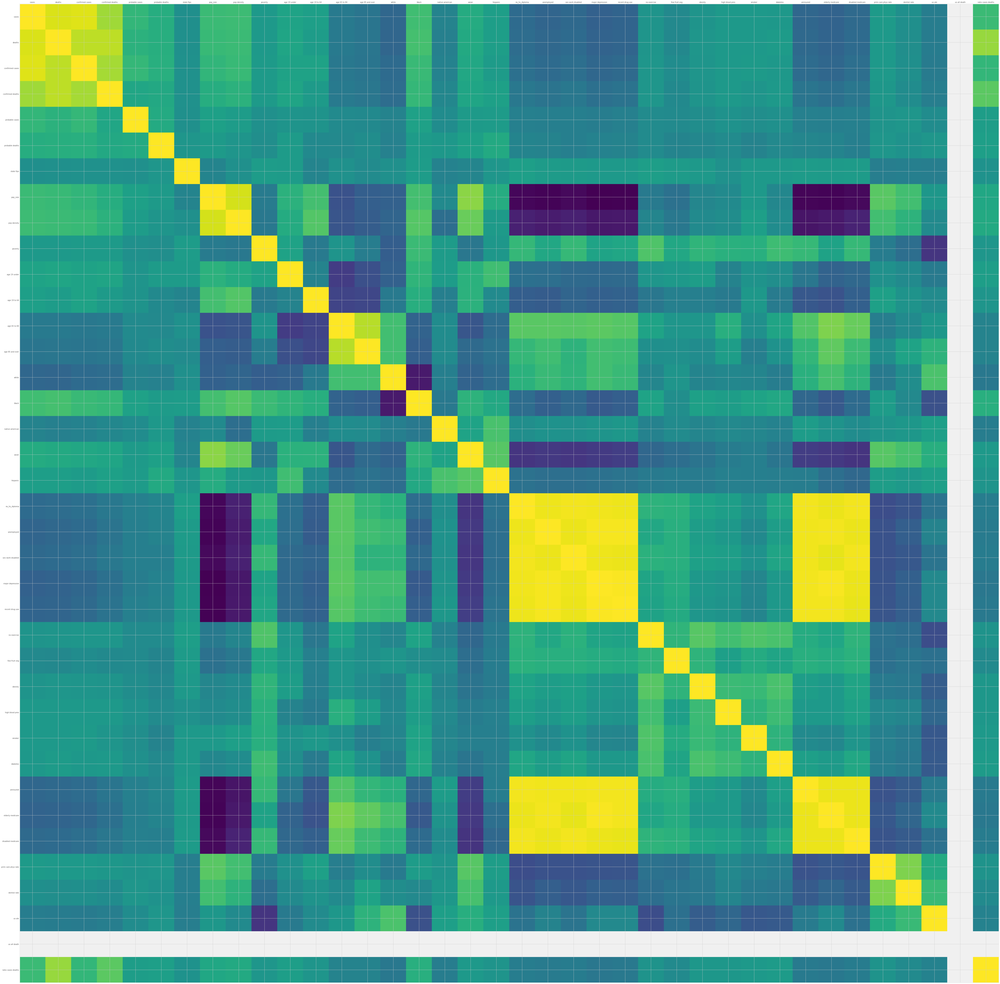

In [285]:
plot_corr(prod)

# Establishing the 'df'  
- [x] ETL complete 

In [172]:
df = prod

# EDA of Data 

In [173]:
#Grouping by one factor 
df_cases = df.groupby(['state','county name','cases', 'deaths' ,'fips','pop_size', 'pop density'])
df_cases=df_cases.size().reset_index(name='count')



In [174]:
df_cases

,state,county name,cases,deaths,fips,pop_size,pop density,count
0,Alabama,Autauga,1389.0,23.0,01001,48612.0,82.0,1
1,Alabama,Baldwin,4347.0,39.0,01003,162586.0,102.0,1
2,Alabama,Barbour,745.0,7.0,01005,28414.0,32.0,1
3,Alabama,Bibb,535.0,6.0,01007,21516.0,35.0,1
4,Alabama,Blount,1219.0,9.0,01009,55725.0,86.0,1
...,...,...,...,...,...,...,...,...
3137,Wyoming,Sublette,296.0,2.0,56037,6926.0,1.0,1
3138,Wyoming,Sweetwater,424.0,1.0,56039,37975.0,4.0,1
3139,Wyoming,Teton,292.0,2.0,56041,19032.0,5.0,1
3140,Wyoming,Uinta,107.0,5.0,56043,19939.0,10.0,1


In [144]:
#Interactive range slider 
#fig = px.line(df, x='state', y='cases', line_shape='linear',  line_group='state', color='state', title='Untitled')
#fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
#        buttons=list([
#            dict(count=1, label="1m", step="month", stepmode="backward"),
#            dict(count=6, label="6m", step="month", stepmode="backward"),
#            dict(count=1, label="YTD", step="year", stepmode="todate"),
#            dict(count=1, label="1y", step="year", stepmode="backward"),
#            dict(step="all")
#        ])
#    )
#)

#fig.show()

In [175]:
fig = px.histogram(df_cases, x=['cases','county name'],y='state',title='null', color='state', hover_data=['fips'], hover_name= 'county name',   facet_row_spacing= 5)
fig.show()


In [176]:
fig = px.histogram(df_cases, x=['cases','state'],y='state',title='null', color='county name', hover_data=['fips'], hover_name= 'county name',   facet_row_spacing= 5)
fig.show()

In [147]:
#my favorite 
df15L = df.nlargest(15,['cases'])
fig = px.box(df15L, y=['cases','confirmed cases','probable cases'], x='state', color = 'state', log_x= False, log_y= True, hover_data=['pop_size','pop density'],
             title =' ', facet_row_spacing=6.5, animation_group ='cases'  )
fig.show()

In [148]:
#plt.figure(figsize=(12,10), dpi=2000)
fig1 = px.scatter(df15L, x='pop density', y='cases', color='state', log_x=False,
                 size='confirmed deaths', width = 1080, height=900, text=df15L['state'] ,trendline="ols", hover_data=['pop density','us ale'] )
fig1.update_layout(title= '4 Features Representation: Target Variable: cases for top concentration areas')
fig1.show()
#sns_plot.savefig("4Features_x='fgr'.pdf")

In [149]:
#plt.figure(figsize=(12,10), dpi=2000)
fig1 = px.scatter(df15L, x='pop density', y='cases', color='state', log_x=True, log_y=True, 
                 size='confirmed deaths', width = 1080, height=900, text=df15L['state'] ,trendline="ols", hover_data=['pop density','us ale'] )
fig1.update_layout(title= '4 Features Representation: Target Variable: cases for top concentration areas')
fig1.show()
#sns_plot.savefig("4Features_x='fgr'.pdf")

In [177]:
df

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,0.028310,0.003275,0.007308,0.011341,0.010131,27.8,78.6,24.5,29.1,26.6,14.2,0.024078,0.020151,0.005116,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,0.007662,0.000958,0.001866,0.003539,0.002933,27.2,76.2,23.6,30.5,24.6,7.2,0.007490,0.008563,0.001452,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,0.083346,0.007048,0.016127,0.020041,0.017378,26.0,79.0,25.6,26.2,17.7,6.6,0.063491,0.040726,0.013526,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,0.115674,0.007733,0.019441,0.026310,0.022336,26.0,86.6,24.3,26.2,23.0,13.1,0.071608,0.051627,0.021040,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,0.036006,0.002637,0.007139,0.010189,0.008614,33.5,74.6,24.2,26.2,23.6,8.4,0.026184,0.016163,0.004186,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,0.110487,0.019596,0.026475,0.106109,0.066084,22.6,81.9,20.7,24.3,15.2,5.0,0.165730,0.159059,0.014384,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,0.021365,0.004771,0.005665,0.018369,0.012357,21.9,80.7,23.6,22.7,27.4,5.3,0.037979,0.022606,0.003966,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,0.021037,0.012065,0.007288,0.040169,0.021783,9.6,68.8,9.0,18.9,13.7,2.4,0.050964,0.038458,0.002264,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,0.046332,0.009785,0.010263,0.033881,0.024223,23.4,83.1,22.7,22.5,21.6,4.8,0.075636,0.035994,0.008980,65.2,40.1,78.2,898.6


In [151]:
#plt.figure(figsize=(12,10), dpi=2000)
fig2 = px.scatter(df_cases, x='pop density', y='cases', color='state', size='deaths', width = 1080, height=900, text=df_cases['state'] ,trendline="ols", hover_data=['pop density'] )
fig2.update_layout(title= '4 Features Representation: Target Variable: cases')
fig2.show()

In [181]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=df.state,
    histnorm='percent',
    name='county name', # name used in legend and hover labels
    xbins=dict( # bins used for histogram
        start=-4.0,
        end=3.0,
        size=0.5
    ),
    marker_color='#EB89B5',
    opacity=0.75
))
fig.add_trace(go.Histogram(
    x=df.cases,
    histnorm='percent',
    name='county name',
    xbins=dict(
        start=-3.0,
        end=4,
        size=0.5
    ),
    marker_color='#330C73',
    opacity=0.75
))

fig.update_layout(
    title_text='Sampled Results', # title of plot
    xaxis_title_text='Value', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1 # gap between bars of the same location coordinates
)

fig.show()

In [182]:
viz = df
#viz_prod['fips'] = viz_prod['fips'].apply(lambda x: str(x).zfill(5)) redundant 
viz

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,0.028310,0.003275,0.007308,0.011341,0.010131,27.8,78.6,24.5,29.1,26.6,14.2,0.024078,0.020151,0.005116,45.3,22.6,74.9,898.6
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,0.007662,0.000958,0.001866,0.003539,0.002933,27.2,76.2,23.6,30.5,24.6,7.2,0.007490,0.008563,0.001452,67.0,30.8,76.6,898.6
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,0.083346,0.007048,0.016127,0.020041,0.017378,26.0,79.0,25.6,26.2,17.7,6.6,0.063491,0.040726,0.013526,45.8,24.6,74.5,898.6
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,0.115674,0.007733,0.019441,0.026310,0.022336,26.0,86.6,24.3,26.2,23.0,13.1,0.071608,0.051627,0.021040,41.8,18.6,73.2,898.6
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,0.036006,0.002637,0.007139,0.010189,0.008614,33.5,74.6,24.2,26.2,23.6,8.4,0.026184,0.016163,0.004186,16.2,10.8,76.1,898.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,0.110487,0.019596,0.026475,0.106109,0.066084,22.6,81.9,20.7,24.3,15.2,5.0,0.165730,0.159059,0.014384,72.2,14.4,76.1,898.6
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,0.021365,0.004771,0.005665,0.018369,0.012357,21.9,80.7,23.6,22.7,27.4,5.3,0.037979,0.022606,0.003966,50.0,52.7,76.1,898.6
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,0.021037,0.012065,0.007288,0.040169,0.021783,9.6,68.8,9.0,18.9,13.7,2.4,0.050964,0.038458,0.002264,147.1,57.8,78.2,898.6
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,0.046332,0.009785,0.010263,0.033881,0.024223,23.4,83.1,22.7,22.5,21.6,4.8,0.075636,0.035994,0.008980,65.2,40.1,78.2,898.6


In [193]:
#use df_cases 
from plotly.subplots import make_subplots
#for i, row in enumerate(viz["county name"]):
    #p = re.compile(" 00:00:00")
    #data = p.split(df["Date"][i])[0]
    #df.iloc[i, 1] = datetime
fig = make_subplots(rows=3, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.03,
    specs=[[{"type": "table"}],
           [{"type": "scatter"}],
           [{"type": "scatter"}]]
)

fig.add_trace(
    go.Scatter(
        x=viz["county name"],
        y=viz["cases"],
        mode="markers",
        name="cases"
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scatter(
        x=viz["county name"],
        y=viz["pop density"],
        mode="markers",
        name="hash-rate-TH/s"
    ),
    row=3, col=1
)

fig.add_trace(
    go.Table(
        header=dict(
            values=["fips", "state", "cases", 'deaths', 'confirmed cases', 'confirmed deaths','probable cases','probable deaths','state fips','county name','pop_size',
                    "poverty", "age 19 under",'age 19 to 64','age 65 to 84','age 85 and over','white','black','native american','asian','hispanic','no_hs_diploma',
                    'unemployed', 'sev work disabled', 'major depression','recent drug use','no exercise','few fruit veg', 'obesity', 'high blodd pres','smoker',
                    'diabetes','uninsured','elderly medicare','disabled medicare','prim care phys rate','dentist rate','us ale','us all death'],
            font=dict(size=10),
            align="left"
        ),
        cells=dict(
            values=[viz[k].tolist() for k in viz.columns[1:]],
            align = "left")
    ),
    row=1, col=1
)
fig.update_layout(
    height=1500,
    showlegend=True,
    title_text="Interactive Display of the Data, values United State Average Live Expectancy, Case Count Covid-19",
)

fig.show()

In [209]:
fig = px.scatter(df_cases, x=['pop density','county name'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [208]:
fig = px.scatter(df, x=['poverty','county name'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [207]:
fig = px.scatter(df, x=['age 19 under','state'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [205]:
fig = px.scatter(df, x=['age 19 to 64','state'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [203]:
fig = px.scatter(df, x=['age 19 to 64','state'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [ ]:
"age 19 under",'age 19 to 64','age 65 to 84','age 85 and over'

In [210]:
fig = px.scatter(df, x=['age 65 to 84','state'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [211]:
fig = px.scatter(df, x=['age 85 and over','state','pop density'], y="cases", color="pop_size",
                 size='pop_size', hover_data=['county name','state'], trendline='ols')
fig.show()

In [215]:
px.violin(df15L, x=['deaths','county name','confirmed deaths'], y="cases", color="state", violinmode=None, hover_data=['county name','state'])  

# SQL Database table creations 
https://towardsdatascience.com/mapping-us-census-data-with-python-607df3de4b9c

In [217]:
from tabulate import tabulate
print(tabulate(df, headers='keys', tablefmt='psql'))

+------+--------+----------------------+---------+----------+-------------------+--------------------+------------------+-------------------+--------------+-------------------------------------+------------------+---------------+-----------+----------------+----------------+----------------+-------------------+---------+---------+-------------------+---------+------------+-----------------+--------------+---------------------+--------------------+-------------------+---------------+-----------------+-----------+-------------------+----------+------------+-------------+--------------------+---------------------+-----------------------+----------------+----------+----------------+
|      |   fips | state                |   cases |   deaths |   confirmed cases |   confirmed deaths |   probable cases |   probable deaths |   state fips | county name                         |         pop_size |   pop density |   poverty |   age 19 under |   age 19 to 64 |   age 65 to 84 |   age 85 and over |

In [226]:
sql_df = df
sql_df

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,ratio cases deaths
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,0.028310,0.003275,0.007308,0.011341,0.010131,27.8,78.6,24.5,29.1,26.6,14.2,0.024078,0.020151,0.005116,45.3,22.6,74.9,898.6,0.016559
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,0.007662,0.000958,0.001866,0.003539,0.002933,27.2,76.2,23.6,30.5,24.6,7.2,0.007490,0.008563,0.001452,67.0,30.8,76.6,898.6,0.008972
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,0.083346,0.007048,0.016127,0.020041,0.017378,26.0,79.0,25.6,26.2,17.7,6.6,0.063491,0.040726,0.013526,45.8,24.6,74.5,898.6,0.009396
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,0.115674,0.007733,0.019441,0.026310,0.022336,26.0,86.6,24.3,26.2,23.0,13.1,0.071608,0.051627,0.021040,41.8,18.6,73.2,898.6,0.011215
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,0.036006,0.002637,0.007139,0.010189,0.008614,33.5,74.6,24.2,26.2,23.6,8.4,0.026184,0.016163,0.004186,16.2,10.8,76.1,898.6,0.007383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,0.110487,0.019596,0.026475,0.106109,0.066084,22.6,81.9,20.7,24.3,15.2,5.0,0.165730,0.159059,0.014384,72.2,14.4,76.1,898.6,0.006757
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,0.021365,0.004771,0.005665,0.018369,0.012357,21.9,80.7,23.6,22.7,27.4,5.3,0.037979,0.022606,0.003966,50.0,52.7,76.1,898.6,0.002358
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,0.021037,0.012065,0.007288,0.040169,0.021783,9.6,68.8,9.0,18.9,13.7,2.4,0.050964,0.038458,0.002264,147.1,57.8,78.2,898.6,0.006849
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,0.046332,0.009785,0.010263,0.033881,0.024223,23.4,83.1,22.7,22.5,21.6,4.8,0.075636,0.035994,0.008980,65.2,40.1,78.2,898.6,0.046729


use the below to set up some advance maths regarding the covid.

In [227]:
from __future__ import division
sql_df['ratio cases deaths'] = sql_df.apply(
   lambda row: row['deaths']/row['cases'], 
   axis = 1)
sql_df

,fips,state,cases,deaths,confirmed cases,confirmed deaths,probable cases,probable deaths,state fips,county name,pop_size,pop density,poverty,age 19 under,age 19 to 64,age 65 to 84,age 85 and over,white,black,native american,asian,hispanic,no_hs_diploma,unemployed,sev work disabled,major depression,recent drug use,no exercise,few fruit veg,obesity,high blood pres,smoker,diabetes,uninsured,elderly medicare,disabled medicare,prim care phys rate,dentist rate,us ale,us all death,ratio cases deaths
0,01001,Alabama,1389.0,23.0,1296.0,22.0,93.0,1.0,1.0,Autauga,48612.0,82.0,10.4,26.9,62.3,9.8,0.9,80.7,17.3,0.5,0.6,1.7,0.028310,0.003275,0.007308,0.011341,0.010131,27.8,78.6,24.5,29.1,26.6,14.2,0.024078,0.020151,0.005116,45.3,22.6,74.9,898.6,0.016559
1,01003,Alabama,4347.0,39.0,4230.0,35.0,117.0,4.0,3.0,Baldwin,162586.0,102.0,10.2,23.5,60.3,14.5,1.8,88.4,9.9,0.5,0.4,2.3,0.007662,0.000958,0.001866,0.003539,0.002933,27.2,76.2,23.6,30.5,24.6,7.2,0.007490,0.008563,0.001452,67.0,30.8,76.6,898.6,0.008972
2,01005,Alabama,745.0,7.0,620.0,7.0,125.0,0.0,5.0,Barbour,28414.0,32.0,22.1,24.3,62.5,11.6,1.6,52.2,46.8,0.4,0.3,3.1,0.083346,0.007048,0.016127,0.020041,0.017378,26.0,79.0,25.6,26.2,17.7,6.6,0.063491,0.040726,0.013526,45.8,24.6,74.5,898.6,0.009396
3,01007,Alabama,535.0,6.0,517.0,5.0,18.0,1.0,7.0,Bibb,21516.0,35.0,16.8,24.6,63.3,10.9,1.2,76.8,22.5,0.3,0.1,1.4,0.115674,0.007733,0.019441,0.026310,0.022336,26.0,86.6,24.3,26.2,23.0,13.1,0.071608,0.051627,0.021040,41.8,18.6,73.2,898.6,0.011215
4,01009,Alabama,1219.0,9.0,983.0,9.0,236.0,0.0,9.0,Blount,55725.0,86.0,11.9,24.5,62.1,12.1,1.3,97.1,1.5,0.5,0.2,6.3,0.036006,0.002637,0.007139,0.010189,0.008614,33.5,74.6,24.2,26.2,23.6,8.4,0.026184,0.016163,0.004186,16.2,10.8,76.1,898.6,0.007383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,296.0,2.0,278.0,5.0,18.0,1.0,35.0,Sublette,6926.0,1.0,7.7,22.4,66.6,9.9,1.0,98.4,0.3,0.6,0.3,2.7,0.110487,0.019596,0.026475,0.106109,0.066084,22.6,81.9,20.7,24.3,15.2,5.0,0.165730,0.159059,0.014384,72.2,14.4,76.1,898.6,0.006757
3138,56039,Wyoming,424.0,1.0,390.0,5.0,34.0,1.0,37.0,Sweetwater,37975.0,4.0,8.6,26.6,65.1,7.4,0.9,95.5,1.1,1.1,1.0,10.3,0.021365,0.004771,0.005665,0.018369,0.012357,21.9,80.7,23.6,22.7,27.4,5.3,0.037979,0.022606,0.003966,50.0,52.7,76.1,898.6,0.002358
3139,56041,Wyoming,292.0,2.0,242.0,5.0,50.0,1.0,39.0,Teton,19032.0,5.0,5.6,18.8,73.3,7.5,0.4,97.9,0.2,0.4,0.8,10.2,0.021037,0.012065,0.007288,0.040169,0.021783,9.6,68.8,9.0,18.9,13.7,2.4,0.050964,0.038458,0.002264,147.1,57.8,78.2,898.6,0.006849
3140,56043,Wyoming,107.0,5.0,99.0,5.0,8.0,1.0,41.0,Uinta,19939.0,10.0,10.6,29.1,63.1,7.0,0.8,97.5,0.1,1.1,0.3,5.9,0.046332,0.009785,0.010263,0.033881,0.024223,23.4,83.1,22.7,22.5,21.6,4.8,0.075636,0.035994,0.008980,65.2,40.1,78.2,898.6,0.046729


In [287]:
#fig = ff.create_choropleth(fips=sql_df.fips, 
#                           scope=['New York'],
#                           values=sql_df['ratio cases deaths'], 
#                           title='NY COVID', 
#                           legend_title='% deaths to cases')
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
#hover_list = list(viz_prod.state)
#hoverinfo='hover_list'
fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=sql_df.fips, z=sql_df['ratio cases deaths'], text=df['county name'],  
                                    showlegend=True, 
                                    colorscale="sunsetdark", zmin=0, zmax= 0.45,
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron", 
                  mapbox_zoom=8, mapbox_center = {"lat": 40.730610, "lon": -73.935242})
fig.update_layout(margin={"r":1,"t":1,"l":1,"b":1})
fig.layout.template = None
fig.show()

In [158]:
#df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/laucnty16.csv')
#viz_prod['state fips'] = df_sample['state fips'].apply(lambda x: str(x).zfill(2))
#viz_prod['fips'] = df_sample['County FIPS Code'].apply(lambda x: str(x).zfill(1))
#viz_prod['FIPS'] = df_sample['State FIPS Code'] + df_sample['County FIPS Code']

colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
              "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
              "#08519c","#0b4083","#08306b"]
endpts = list(np.linspace(1, 20000, len(colorscale) - 1))
fips = viz['fips'].tolist()
values = viz['confirmed cases'].tolist()
#ff.create_annotated_heatmap()
#ff.create_choropleth()
fig = ff.create_choropleth(
    fips=fips, values=values,
    binning_endpoints=endpts,
    colorscale=colorscale,
    show_state_data=True,
    show_hover=True, centroid_marker={'opacity': 0},
    asp=2.9, title='USA confirmed case numbers ',
    legend_title=' total confirmed cases')
fig.layout.xaxis.fixedrange = False 
fig.layout.yaxis.fixedrange = False 
fig.layout.template = None
fig.show()

In [269]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
#hover_list = list(viz_prod.state)
#hoverinfo='hover_list'
fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=viz.fips, z=viz['cases'], showlegend=True, 
                                    colorscale="sunsetdark", zmin=0, zmax=35000,
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron", 
                  mapbox_zoom=3.8, mapbox_center = {"lat": 38.0902, "lon": -95.7129})
fig.update_layout(margin={"r":1,"t":1,"l":1,"b":1})
fig.show()

#Models 
K-Means
Multivariate 
